In [7]:
 
from fastai import *
from fastai.vision import *
import torch.onnx
from torch.autograd import Variable
import os
from fastai.callbacks import OverSamplingCallback
from torch.optim import *
from PIL import Image, ImageDraw, ImageFilter, ImageFont
import random

In [8]:
os.environ["TORCH_HOME"] = "/media/subhaditya/DATA/COSMO/Datasets-Useful"

In [9]:
 
path = Path('/media/subhaditya/DATA/COSMO/Datasets/rotator')
 

# Crappify

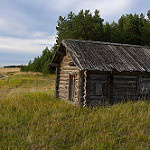

In [46]:
im_t = PIL.Image.open(path/'normal/0100.jpg');im_t

77


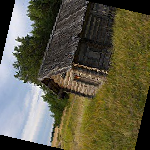

In [47]:
ang = random.randint(0,181)
print(ang)
im_t.rotate(ang)

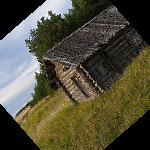

In [65]:
im_t.rotate(41)

In [48]:

path_hr = path/'normal'
path_lr = path/'crappy'

In [49]:
class crappifier(object):
    def __init__(self, path_lr, path_hr):
        self.path_lr = path_lr
        self.path_hr = path_hr

    def __call__(self, fn, i):
        ang = random.randint(0,181)
        dest = self.path_lr/Path(str(ang)+"~"+str(fn.relative_to(self.path_hr)))
#         print(dest)
#         dest.parent.mkdir(parents=True, exist_ok=True)
        img = PIL.Image.open(fn)
        
        img.rotate(ang)
        img.save(dest)

In [50]:
# verify_images(path_hr)

In [51]:
il = ImageList.from_folder(path_hr)

In [52]:
len(il)

4939

In [53]:
il.items[0]

PosixPath('/media/subhaditya/DATA/COSMO/Datasets/rotator/normal/0001.jpg')

In [54]:
parallel(crappifier(path_lr, path_hr), il.items)

In [55]:
ImageList.from_folder(path_lr).items[1000]

PosixPath('/media/subhaditya/DATA/COSMO/Datasets/rotator/crappy/177~0024.jpg')

# Main model

In [27]:
import warnings
warnings.filterwarnings("ignore")

In [28]:
def y_func(x): return int(str(x).split("/")[-1].split("~")[0])

In [60]:
data = (ImageList.from_folder(path_lr)
       .split_by_rand_pct()
        .label_from_func(y_func, label_cls=FloatList, log=False)
        .transform(get_transforms(None),size = 128)
       ).databunch(bs = 128).normalize(imagenet_stats)
#  max_rotate = 0.0, max_warp=0.0,do_flip=False, flip_vert=False, p_affine=0.0

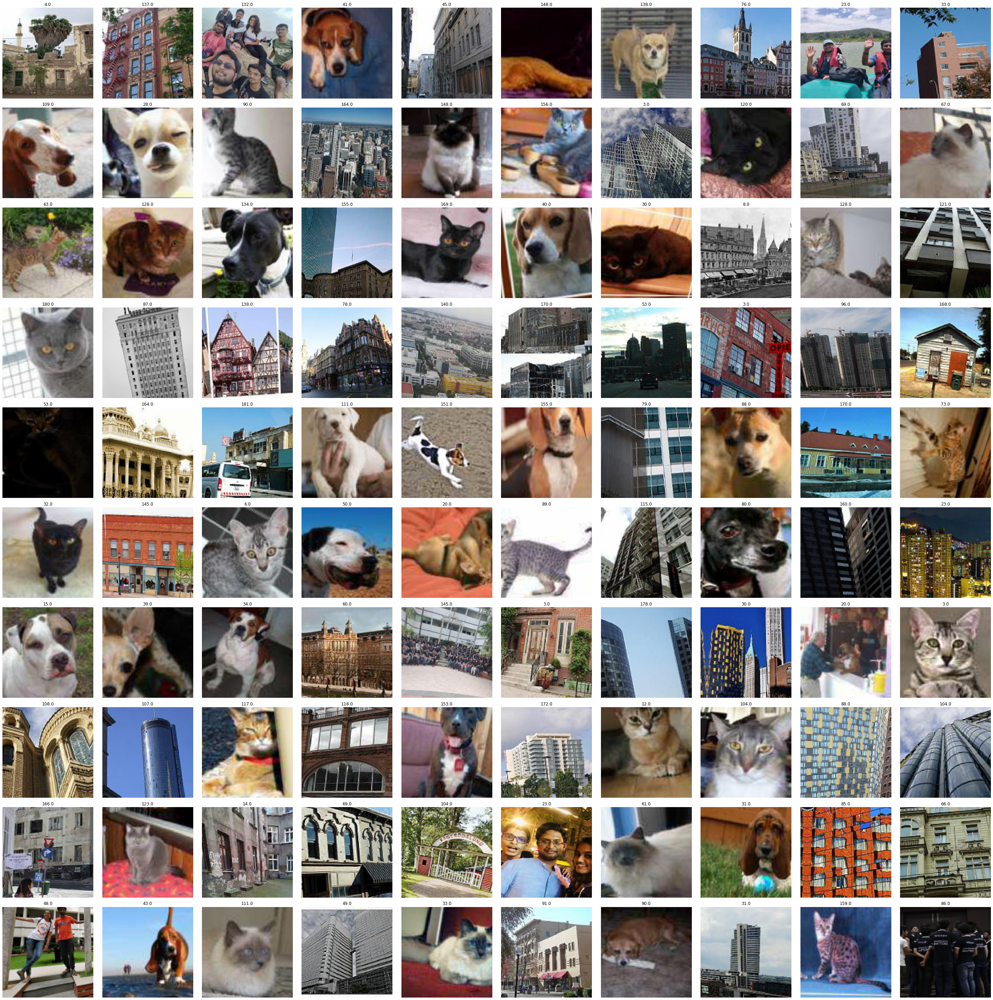

In [62]:
data.show_batch(10)

In [31]:
data.c

1

## EfficientNet b0

In [70]:
from efficientnet_pytorch import EfficientNet
arch = EfficientNet.from_pretrained("efficientnet-b0", advprop=True)
arch._fc = nn.Linear(1280, data.c)
loss_func = MSELossFlat()

Loaded pretrained weights for efficientnet-b0


In [71]:
learn = None
gc.collect()

222286

- I used accuracy by mistake but was too far gone to remove it so I didnt bother

In [159]:
learn = Learner(data, arch, loss_func=loss_func, metrics=accuracy,callback_fns = [ShowGraph]).to_fp16()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


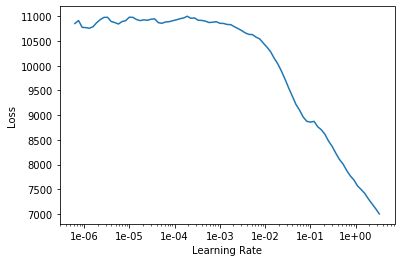

In [73]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,10624.269531,11383.963867,0.002026,00:25
1,9227.997070,17253.654297,0.002026,00:23
2,6468.355469,1248376.125000,0.002026,00:21
3,4671.453613,17665.525391,0.002026,00:20
4,3782.482422,5020.323730,0.002026,00:21
5,3328.585205,5360.301758,0.002026,00:22
6,3078.701416,3657.897705,0.002026,00:21
7,2943.405518,3104.081543,0.002026,00:20
8,2871.621094,3132.477783,0.002026,00:21
9,2820.582520,2964.850098,0.002026,00:21


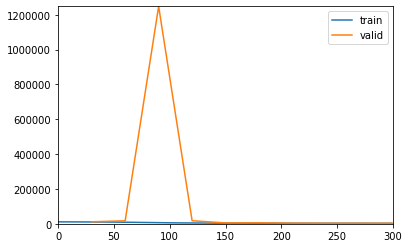

In [74]:
learn.unfreeze()
learn.fit_one_cycle(10, wd = 1e-3)
 

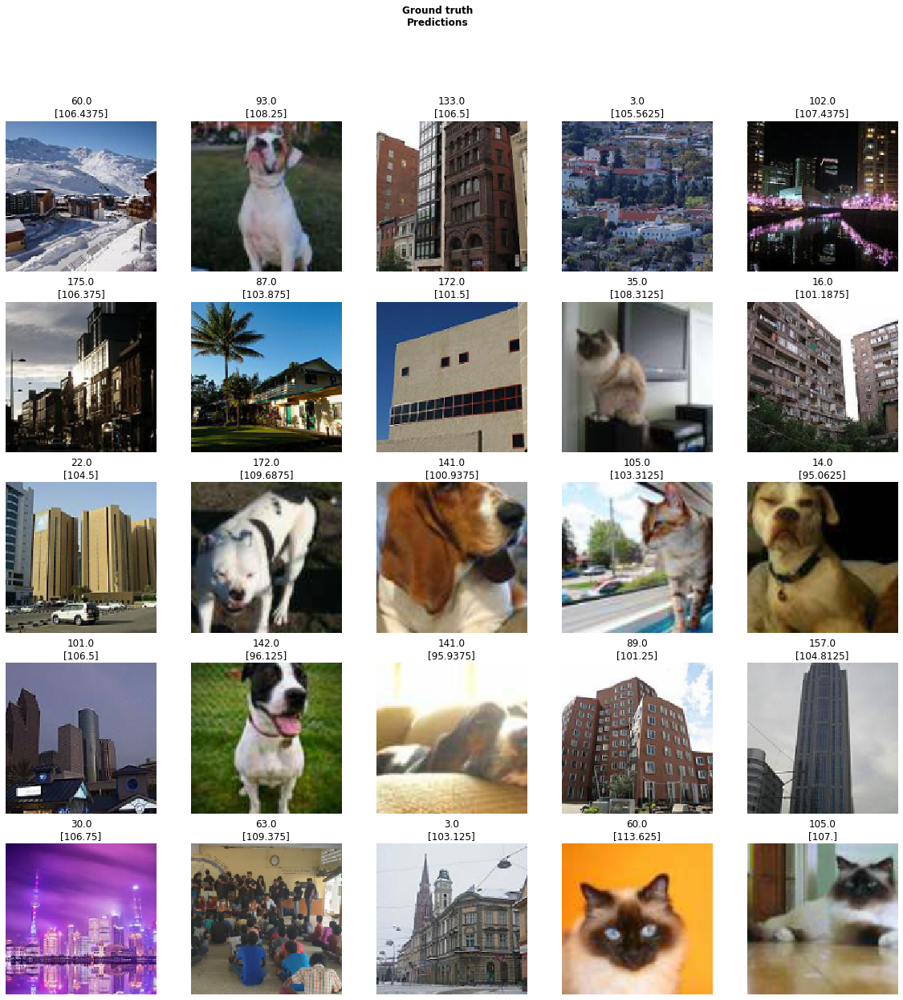

In [75]:
learn.show_results()

epoch,train_loss,valid_loss,accuracy,time
0,2771.477295,2877.222168,0.002026,00:22
1,2777.025879,2775.588135,0.002026,00:21
2,2786.369629,17324.802734,0.002026,00:21
3,2799.547607,3246937.000000,0.002026,00:23
4,2785.666992,9089.998047,0.002026,00:22
5,2789.930176,3886.985352,0.002026,00:20
6,2798.220947,3728.023193,0.002026,00:22
7,2792.164062,3188.223877,0.002026,00:22
8,2790.436523,2894.835449,0.002026,00:20
9,2778.673828,2793.866211,0.002026,00:22


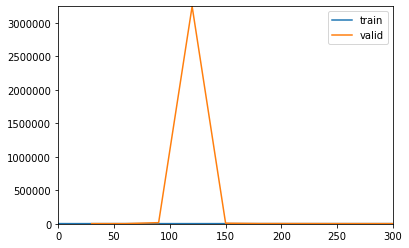

In [76]:
learn.unfreeze()
learn.fit_one_cycle(10, wd = 1e-3)


In [150]:
learn.save('eff1')

In [171]:
learn = None
gc.collect()

10511

# Eff+adamw+mixup

In [173]:
learn = Learner(data, arch, loss_func=loss_func,callback_fns = [ShowGraph],opt_func=AdamW).mixup().to_fp16()

epoch,train_loss,valid_loss,time
0,2778.058594,#na#,00:19
1,2790.296631,#na#,00:16
2,3152.822510,#na#,00:19


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


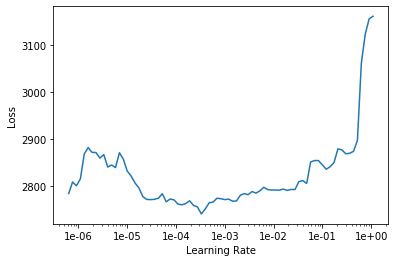

In [174]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,time
0,2776.537109,2701.436279,00:24
1,2785.931641,2782.614990,00:20
2,2789.604492,4622.294434,00:20
3,2780.742432,152887.046875,00:21
4,2787.539062,nan,00:20
5,2789.720459,nan,00:21
6,2787.804443,25241.742188,00:21
7,2782.416016,3366.090576,00:21
8,2787.333984,2878.835693,00:21
9,2778.891357,2793.342529,00:20


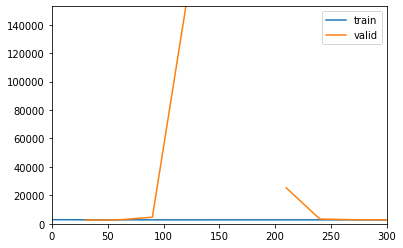

In [175]:
learn.unfreeze()
learn.fit_one_cycle(10, 3e-3, wd = 1e-3)
 

In [180]:
learn.save('effMix')

63


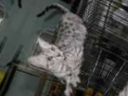

In [196]:
im_t = open_image("/home/subhaditya/Desktop/Datasets/unsharp2sharp/trainA/Egyptian_Mau_171.jpg");im_t
ang = random.randint(0,181)
print(ang)
te = im_t.rotate(ang);te

101


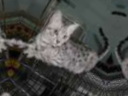

In [197]:
fix = int(learn.predict(te)[1]);print(fix)
im_t.rotate(-fix)

67


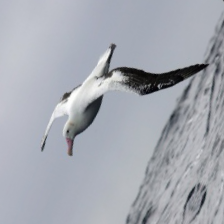

In [198]:
im_t = open_image("/home/subhaditya/Desktop/Datasets/100-bird-species/test/ALBATROSS/1.jpg");im_t
ang = random.randint(0,181)
print(ang)
te = im_t.rotate(ang);te

98


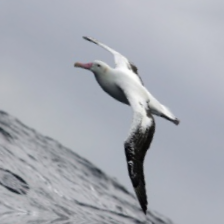

In [199]:
fix = int(learn.predict(im_t)[1]);print(fix)
im_t.rotate(-fix)

142


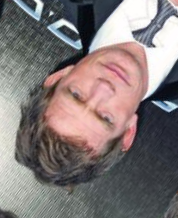

In [210]:
im_t = open_image("/home/subhaditya/Desktop/Datasets/celebA/004899.jpg");im_t
ang = random.randint(0,181)
print(ang)
te = im_t.rotate(ang);te

100


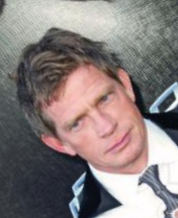

In [211]:
fix = int(learn.predict(im_t)[1]);print(fix)
im_t.rotate(-fix)


101


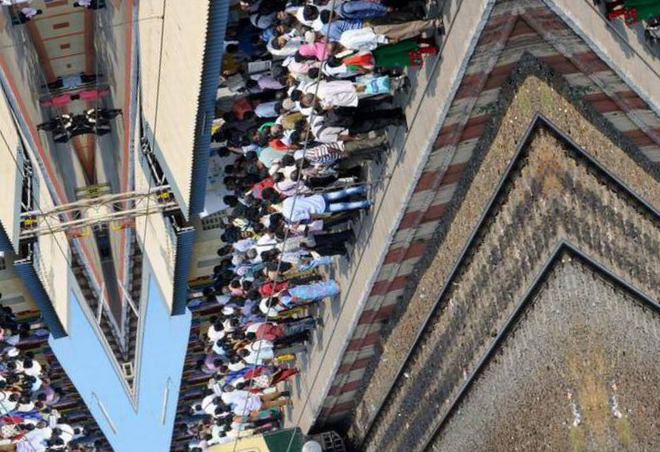

In [212]:
im_t = open_image("/media/subhaditya/DATA/COSMO/Datasets/jhu_crowd_v2/test/images/0120.jpg"
);im_t
ang = random.randint(0,181)
print(ang)
te = im_t.rotate(ang);te

100


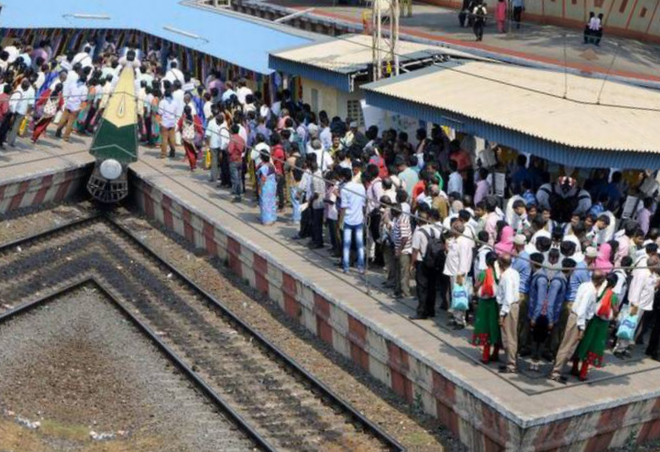

In [213]:
fix = int(learn.predict(im_t)[1]);print(fix)
im_t.rotate(-fix)


# Resnet 18

In [155]:
learn = None
gc.collect()

8071

In [156]:
learn = cnn_learner(data, models.resnet18, loss_func=loss_func,callback_fns = [ShowGraph]).to_fp16()

epoch,train_loss,valid_loss,time
0,10984.948242,#na#,00:17
1,10918.937500,#na#,00:14
2,25035.718750,#na#,00:15


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


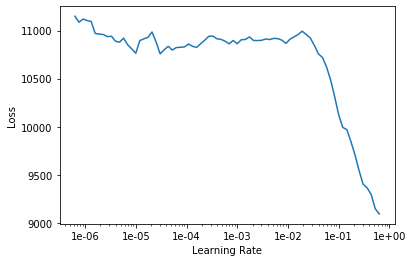

In [157]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,time
0,10880.588867,10859.996094,00:20
1,10788.494141,10537.509766,00:22
2,10385.023438,10885.414062,00:18


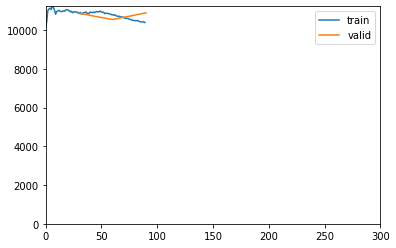

KeyboardInterrupt: 

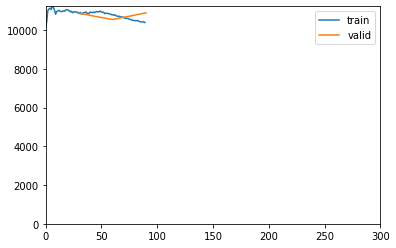

In [158]:
learn.unfreeze()
learn.fit_one_cycle(10, wd = 1e-3)
 

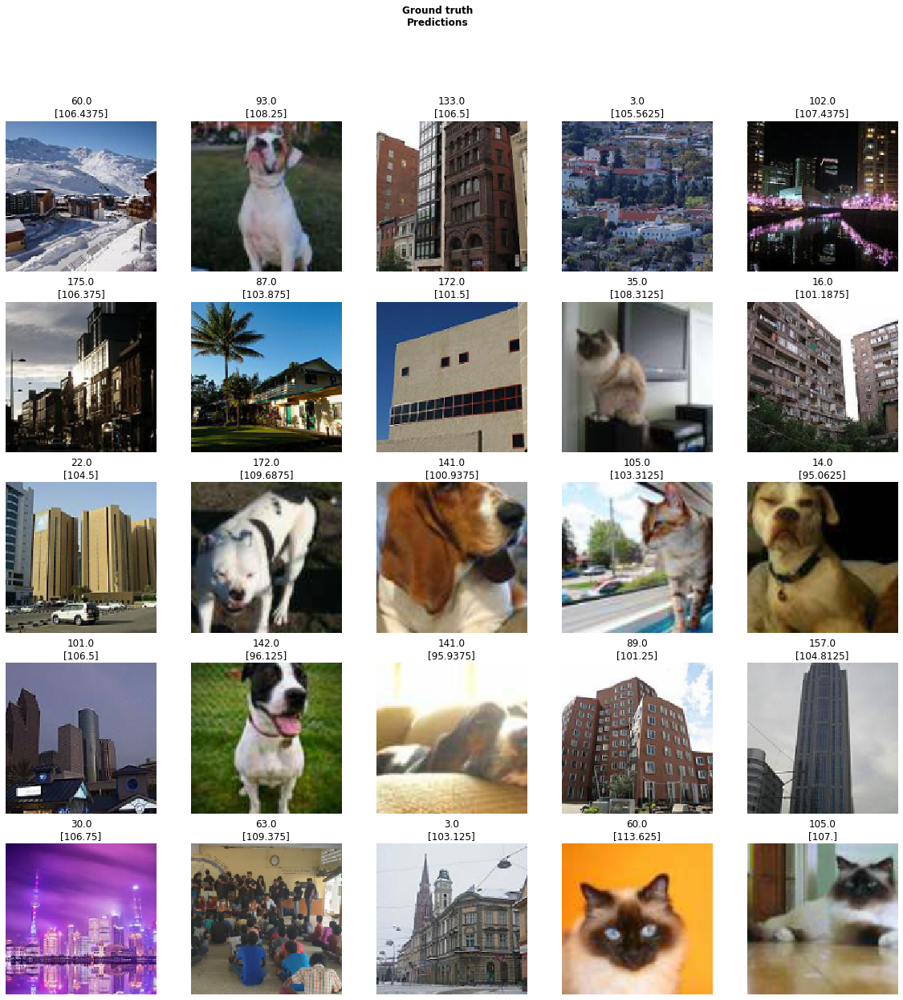

In [75]:
learn.show_results()

epoch,train_loss,valid_loss,accuracy,time
0,2771.477295,2877.222168,0.002026,00:22
1,2777.025879,2775.588135,0.002026,00:21
2,2786.369629,17324.802734,0.002026,00:21
3,2799.547607,3246937.000000,0.002026,00:23
4,2785.666992,9089.998047,0.002026,00:22
5,2789.930176,3886.985352,0.002026,00:20
6,2798.220947,3728.023193,0.002026,00:22


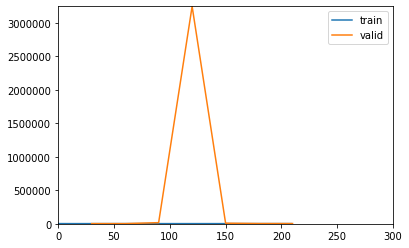

In [ ]:
learn.unfreeze()
learn.fit_one_cycle(10, wd = 1e-3)


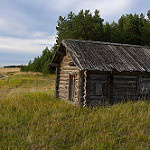

In [46]:
im_t = PIL.Image.open("/home/subhaditya/Desktop/Datasets/unsharp2sharp/trainA/Egyptian_Mau_171.jpg");im_t